# Wine Reviews

## Attributes

- ####  row_id
- ####  country: The country that the wine is from
- ####  description: A few sentences from a sommelier describing the wine's taste, smell, look, feel, etc.
- ####  designation: The vineyard within the winery where the grapes that made the wine are from
- ####  points: The number of points WineEnthusiast rated the wine on a scale of 1-100 (though they say they only post reviews for wines that score >=80)
- ####  price: The cost for a bottle of the wine
- ####  province: The province or state that the wine is from
- ####  region_1: The wine growing area in a province or state (ie Napa)
- ####  region_2: Sometimes there are more specific regions specified within a wine growing area (ie Rutherford inside the Napa Valley), but this value can sometimes be blank
- ####  taster_name: Name of the person who tasted and reviewed the wine
- ####  taster_twitter_handle: Twitter handle for the person who tasted and reviewed the wine
- ####  title: The title of the wine review, which often contains the vintage if you're interested in extracting that feature
- ####  variety: The type of grapes used to make the wine (ie Pinot Noir)
- ####  winery: The winery that made the wine



## Import Libraries

In [339]:
import pandas as pd
import numpy as np
import joblib
import time


import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import ParameterGrid, GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, plot_confusion_matrix, classification_report
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
%matplotlib inline

## Load data

In [340]:
data = pd.read_csv('winemag-data-130k-v2.csv')

## Basic data exploration

In [341]:
data.columns

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'price', 'province', 'region_1', 'region_2', 'taster_name',
       'taster_twitter_handle', 'title', 'variety', 'winery'],
      dtype='object')

In [342]:
data.head()

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [343]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             129971 non-null  int64  
 1   country                129908 non-null  object 
 2   description            129971 non-null  object 
 3   designation            92506 non-null   object 
 4   points                 129971 non-null  int64  
 5   price                  120975 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103727 non-null  object 
 10  taster_twitter_handle  98758 non-null   object 
 11  title                  129971 non-null  object 
 12  variety                129970 non-null  object 
 13  winery                 129971 non-null  object 
dtypes: float64(1), int64(2), object(11)


In [344]:
#missing values
data.isnull().sum()

Unnamed: 0                   0
country                     63
description                  0
designation              37465
points                       0
price                     8996
province                    63
region_1                 21247
region_2                 79460
taster_name              26244
taster_twitter_handle    31213
title                        0
variety                      1
winery                       0
dtype: int64

In [345]:
data["points"].value_counts()

88     17207
87     16933
90     15410
86     12600
89     12226
91     11359
92      9613
85      9530
93      6489
84      6480
94      3758
83      3025
82      1836
95      1535
81       692
96       523
80       397
97       229
98        77
99        33
100       19
Name: points, dtype: int64

## Treat missing values and all data columns

### Treatment of the column Country

#### Check if we can obtain the country and province from regions

In [346]:
#count rows if we can obtain the country and province from regions
data[data['country'].isnull() & data['province'].isnull() & data['region_1'].notnull() & data['region_2'].notnull()].shape[0]

0

In [347]:
#check if all the missing countries have miss province
data[data['country'].isnull() & data['province'].isnull() & data['title'].notnull()].shape[0]

63

#### Get the country trhough the winery

In [348]:
#print row with missing country and province
data[data['country'].isnull() & data['province'].isnull() & data['title'].notnull()]

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
913,913,NaN,"Amber in color, this wine has aromas of peach ...",Asureti Valley,87,30.0,NaN,NaN,NaN,Mike DeSimone,@worldwineguys,Gotsa Family Wines 2014 Asureti Valley Chinuri,Chinuri,Gotsa Family Wines
3131,3131,NaN,"Soft, fruity and juicy, this is a pleasant, si...",Partager,83,NaN,NaN,NaN,NaN,Roger Voss,@vossroger,Barton & Guestier NV Partager Red,Red Blend,Barton & Guestier
4243,4243,NaN,"Violet-red in color, this semisweet wine has a...",Red Naturally Semi-Sweet,88,18.0,NaN,NaN,NaN,Mike DeSimone,@worldwineguys,Kakhetia Traditional Winemaking 2012 Red Natur...,Ojaleshi,Kakhetia Traditional Winemaking
9509,9509,NaN,This mouthwatering blend starts with a nose of...,Theopetra Malagouzia-Assyrtiko,92,28.0,NaN,NaN,NaN,Susan Kostrzewa,@suskostrzewa,Tsililis 2015 Theopetra Malagouzia-Assyrtiko W...,White Blend,Tsililis
9750,9750,NaN,This orange-style wine has a cloudy yellow-gol...,Orange Nikolaevo Vineyard,89,28.0,NaN,NaN,NaN,Jeff Jenssen,@worldwineguys,Ross-idi 2015 Orange Nikolaevo Vineyard Chardo...,Chardonnay,Ross-idi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124176,124176,NaN,This Swiss red blend is composed of four varie...,Les Romaines,90,30.0,NaN,NaN,NaN,Jeff Jenssen,@worldwineguys,Les Frères Dutruy 2014 Les Romaines Red,Red Blend,Les Frères Dutruy
129407,129407,NaN,Dry spicy aromas of dusty plum and tomato add ...,Reserve,89,22.0,NaN,NaN,NaN,Michael Schachner,@wineschach,El Capricho 2015 Reserve Cabernet Sauvignon,Cabernet Sauvignon,El Capricho
129408,129408,NaN,El Capricho is one of Uruguay's more consisten...,Reserve,89,22.0,NaN,NaN,NaN,Michael Schachner,@wineschach,El Capricho 2015 Reserve Tempranillo,Tempranillo,El Capricho
129590,129590,NaN,"A blend of 60% Syrah, 30% Cabernet Sauvignon a...",Shah,90,30.0,NaN,NaN,NaN,Mike DeSimone,@worldwineguys,Büyülübağ 2012 Shah Red,Red Blend,Büyülübağ


In [349]:
#get rows with winery 'Gotsa Family Wines'
data[data['variety'] == 'Chinuri']

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
913,913,NaN,"Amber in color, this wine has aromas of peach ...",Asureti Valley,87,30.0,NaN,NaN,NaN,Mike DeSimone,@worldwineguys,Gotsa Family Wines 2014 Asureti Valley Chinuri,Chinuri,Gotsa Family Wines
39239,39239,Georgia,Whiffs of smoke and sea breeze entice on the n...,Chardakhi White Dry With Skin Contact Unfiltered,87,18.0,Georgia,NaN,NaN,Anna Lee C. Iijima,NaN,Iago's Wine 2010 Chardakhi White Dry With Skin...,Chinuri,Iago's Wine
110970,110970,Georgia,"Honey gold in color, this wine made from an in...",Dry Unfiltered,84,28.0,Georgia,NaN,NaN,Mike DeSimone,@worldwineguys,Gotsa Family Wines 2015 Dry Unfiltered Chinuri...,Chinuri,Gotsa Family Wines


In [350]:
#get the country from winery

def get_country(row, df):
    if row['country'] is np.nan:
        new_countrys = df[df['winery'] == row['winery']]['country']
        for country in new_countrys:
            if country is not np.nan:
                return country
        return country
    else:
        return row['country']

data['country'] = data.apply(lambda row: get_country(row, data), axis=1)

#count rows with missing country
data[data['country'].isnull()].shape[0]

31

#### Drop the remaining rows with missing country

In [351]:
#drop rows with missing country
data = data[data['country'].notnull()]

### Treatment of the column Province

#### Get the province through the variety

In [352]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129940 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             129940 non-null  int64  
 1   country                129940 non-null  object 
 2   description            129940 non-null  object 
 3   designation            92480 non-null   object 
 4   points                 129940 non-null  int64  
 5   price                  120944 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103696 non-null  object 
 10  taster_twitter_handle  98727 non-null   object 
 11  title                  129940 non-null  object 
 12  variety                129939 non-null  object 
 13  winery                 129940 non-null  object 
dtypes: float64(1), int64(2), object(11)


In [353]:
vcp_table = data[data['variety'].notnull() & data['country'].notnull() & data['province'].notnull()].groupby(['variety', 'country','province']).size().reset_index(name='counts')
vcp_table

,variety,country,province,counts
0,Abouriou,France,Southwest France,2
1,Abouriou,US,California,1
2,Agiorgitiko,Greece,Arcadia,1
3,Agiorgitiko,Greece,Attica,1
4,Agiorgitiko,Greece,Corinth,2
...,...,...,...,...
4114,Zweigelt,Croatia,Kutjevo,1
4115,Zweigelt,US,New York,2
4116,Zweigelt,US,Washington,5
4117,Çalkarası,Turkey,Aegean,2


In [354]:
vcp_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4119 entries, 0 to 4118
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   variety   4119 non-null   object
 1   country   4119 non-null   object
 2   province  4119 non-null   object
 3   counts    4119 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 128.8+ KB


In [355]:
#get the province from variety

def get_province(row, vcp_table):
    if row['province'] is np.nan:
        rows_table = vcp_table[vcp_table['variety'] == row['variety']]
        rows_table = rows_table[rows_table['country'] == row['country']]
        count = 0
        province = ''
        for row in rows_table.iterrows():
            if row[1]['counts'] > count:
                count = row[1]['counts']
                province = row[1]['province']
        return province
    else:
        return row['province']
                

data['province'] = data.apply(lambda row: get_province(row, vcp_table), axis=1)

In [356]:
data['province'].describe()

count         129940
unique           426
top       California
freq           36247
Name: province, dtype: object

In [357]:
data.isnull().sum()

Unnamed: 0                   0
country                      0
description                  0
designation              37460
points                       0
price                     8996
province                     0
region_1                 21216
region_2                 79429
taster_name              26244
taster_twitter_handle    31213
title                        0
variety                      1
winery                       0
dtype: int64

### Treatment of the column Taster twitter handle

In [358]:
#rows with missing taster_name and taster_twitter_handle
data[data['taster_name'].isnull() & data['taster_twitter_handle'].notna()].shape[0]

0

#### Drop of the tasting twitter handle column

In [359]:
data.drop(columns=['taster_twitter_handle'], inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129940 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   129940 non-null  int64  
 1   country      129940 non-null  object 
 2   description  129940 non-null  object 
 3   designation  92480 non-null   object 
 4   points       129940 non-null  int64  
 5   price        120944 non-null  float64
 6   province     129940 non-null  object 
 7   region_1     108724 non-null  object 
 8   region_2     50511 non-null   object 
 9   taster_name  103696 non-null  object 
 10  title        129940 non-null  object 
 11  variety      129939 non-null  object 
 12  winery       129940 non-null  object 
dtypes: float64(1), int64(2), object(10)
memory usage: 13.9+ MB


### Treatment of the column Variety

In [360]:
data[data["variety"].isnull()]

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
86909,86909,Chile,"A chalky, dusty mouthfeel nicely balances this...",NaN,88,17.0,Maipo Valley,NaN,NaN,NaN,Carmen 1999 (Maipo Valley),NaN,Carmen


In [361]:
data[data["province"] == "Maipo Valley"]

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
58,58,Chile,Lightly herbal strawberry and raspberry aromas...,Reserve,85,13.0,Maipo Valley,NaN,NaN,Michael Schachner,Tres Palacios 2011 Reserve Pinot Noir (Maipo V...,Pinot Noir,Tres Palacios
165,165,Chile,"Dry, briary aromas of field brush, black olive...",20 Barrels,91,32.0,Maipo Valley,NaN,NaN,Michael Schachner,Cono Sur 2012 20 Barrels Cabernet Sauvignon (M...,Cabernet Sauvignon,Cono Sur
176,176,Chile,Haven't seen this unusual combination of grape...,Unusual Cabernet-Shiraz-Zinfandel,88,50.0,Maipo Valley,NaN,NaN,Michael Schachner,TerraMater 2006 Unusual Cabernet-Shiraz-Zinfan...,Red Blend,TerraMater
296,296,Chile,"Rooty and leafy on the nose, with red berry ar...",Grey [Glacier] Single Block Trinidad Vineyard,87,20.0,Maipo Valley,NaN,NaN,Michael Schachner,Ventisquero 2008 Grey [Glacier] Single Block T...,Cabernet Sauvignon,Ventisquero
367,367,Chile,"Aromas of mint, berry syrup and dense, lemony ...",Reserva de la Familia,88,10.0,Maipo Valley,NaN,NaN,Michael Schachner,De Martino 1999 Reserva de la Familia Carmenèr...,Carmenère,De Martino
...,...,...,...,...,...,...,...,...,...,...,...,...,...
128251,128251,Chile,"Quite staunch and almost sour smelling, with a...",Reserva,81,9.0,Maipo Valley,NaN,NaN,Michael Schachner,Santa Alicia 2008 Reserva Carmenère (Maipo Val...,Carmenère,Santa Alicia
128597,128597,Chile,Peachy aromas come with an oily essence. This ...,Reserva,85,10.0,Maipo Valley,NaN,NaN,Michael Schachner,Haras de Pirque 2016 Reserva Chardonnay (Maipo...,Chardonnay,Haras de Pirque
128883,128883,Chile,Medicinal berry aromas are outweighed by a str...,Gran Reserva,85,15.0,Maipo Valley,NaN,NaN,Michael Schachner,Indomita 2016 Gran Reserva Cabernet Sauvignon ...,Cabernet Sauvignon,Indomita
129259,129259,Chile,"Despite cool conditions in 2011, or quite poss...",Casa Real,93,85.0,Maipo Valley,NaN,NaN,Michael Schachner,Santa Rita 2011 Casa Real Cabernet Sauvignon (...,Cabernet Sauvignon,Santa Rita


In [362]:
data.drop(data[data["variety"].isnull()].index, inplace=True)

In [363]:
data.isna().sum()

Unnamed: 0         0
country            0
description        0
designation    37459
points             0
price           8996
province           0
region_1       21215
region_2       79428
taster_name    26243
title              0
variety            0
winery             0
dtype: int64

In [364]:
data = data.iloc[:, 1:]
data.head()

,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


### Treatment of the column Taster_Name

In [365]:
data["taster_name"].value_counts()
#print(data["taster_name"].describe())

Roger Voss            25514
Michael Schachner     15131
Kerin O’Keefe         10776
Virginie Boone         9537
Paul Gregutt           9532
Matt Kettmann          6332
Joe Czerwinski         5147
Sean P. Sullivan       4966
Anna Lee C. Iijima     4415
Jim Gordon             4177
Anne Krebiehl MW       3685
Lauren Buzzeo          1834
Susan Kostrzewa        1082
Mike DeSimone           511
Jeff Jenssen            470
Alexander Peartree      415
Carrie Dykes            139
Fiona Adams              27
Christina Pickard         6
Name: taster_name, dtype: int64

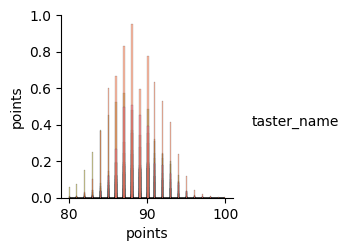

In [366]:
# taster_name and price pairplot
sns.pairplot(data, hue="taster_name", vars=["points"],diag_kind="hist")

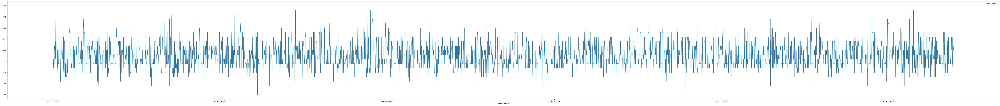

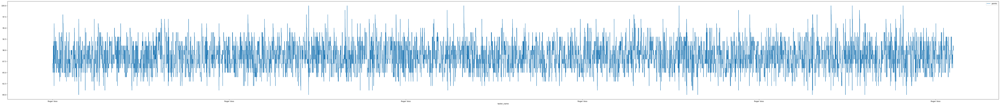

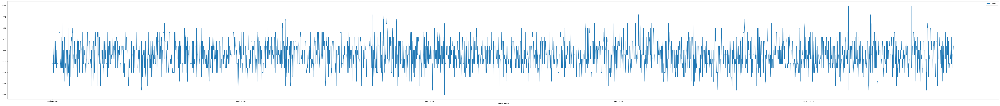

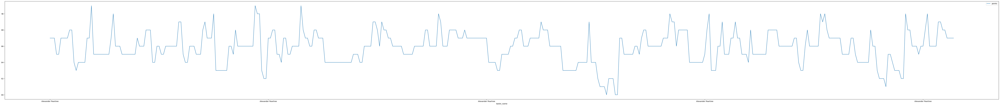

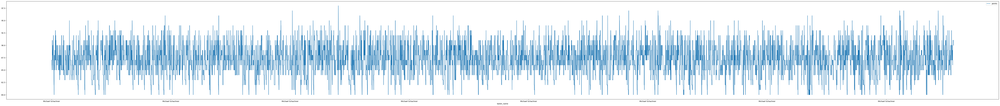

...

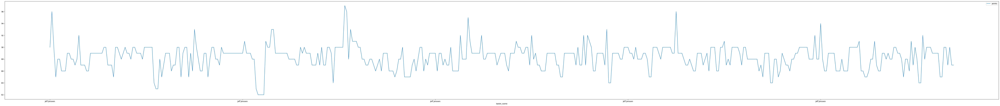

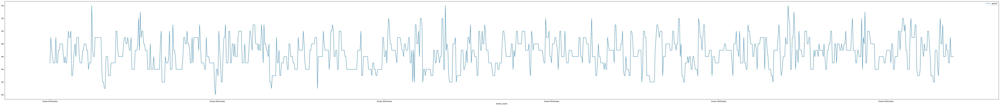

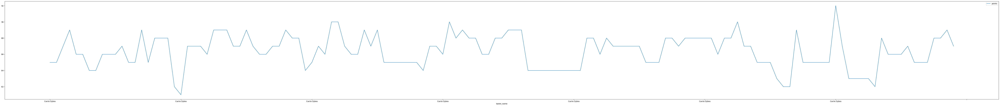

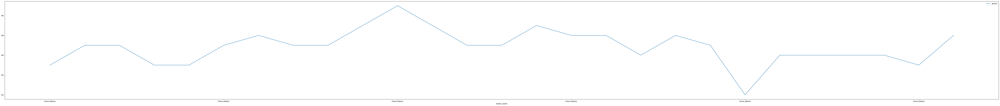

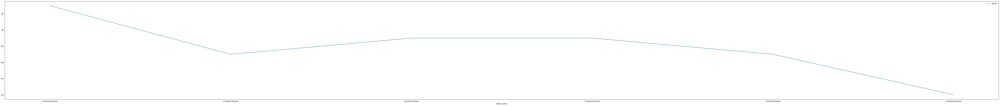

In [367]:
for i in data["taster_name"].unique():
    data[data["taster_name"] == i].plot(x="taster_name",y="points",kind="line", figsize=(100, 10))


In [368]:
for i in data["taster_name"].unique():
    d = data[data["taster_name"] == i]
    print(i, d["points"].mean())

Kerin O’Keefe 88.86794729027469
Roger Voss 88.70800344908677
Paul Gregutt 89.08256399496433
Alexander Peartree 85.855421686747
Michael Schachner 86.90701209437579
Anna Lee C. Iijima 88.41562853907135
Virginie Boone 89.21337946943483
Matt Kettmann 90.00868603916614
nan nan
Sean P. Sullivan 88.75573902537253
Jim Gordon 88.62628680871438
Joe Czerwinski 88.53623469982514
Anne Krebiehl MW 90.56255088195387
Lauren Buzzeo 87.73936750272628
Mike DeSimone 89.09980430528375
Jeff Jenssen 88.32765957446809
Susan Kostrzewa 86.60073937153419
Carrie Dykes 86.39568345323741
Fiona Adams 86.88888888888889
Christina Pickard 87.83333333333333


In [369]:
data["taster_name"].isna().sum()

26243

In [370]:
data.drop(data[data["taster_name"].isna()].index, inplace=True)
data["taster_name"].isna().sum()

0

### Treatment of the column Designation

In [371]:
#check how many different designations are 
designations = data['designation'].value_counts()
#save designations in a file
designations.to_csv('designations.csv')

In [372]:
##change rows with designation 'Reserva' to 'Reserve'
#data['designation'] = data['designation'].replace('Reserva', 'Reserve')
##change rows with designation 'Riserva' to 'Reserve'
#data['designation'] = data['designation'].replace('Riserva', 'Reserve')
##change rows with designation 'Estate Grown' to 'Estate'
#data['designation'] = data['designation'].replace('Estate Grown', 'Estate')

In [373]:
data['designation'].describe()

count       74964
unique      32059
top       Reserve
freq         1442
Name: designation, dtype: object

In [374]:
#rows with missing designation
data[data['designation'].isnull()]

,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
7,France,This dry and restrained wine offers spice in p...,NaN,87,24.0,Alsace,Alsace,NaN,Roger Voss,Trimbach 2012 Gewurztraminer (Alsace),Gewürztraminer,Trimbach
11,France,"This is a dry wine, very spicy, with a tight, ...",NaN,87,30.0,Alsace,Alsace,NaN,Roger Voss,Leon Beyer 2012 Gewurztraminer (Alsace),Gewürztraminer,Leon Beyer
12,US,"Slightly reduced, this wine offers a chalky, t...",NaN,87,34.0,California,Alexander Valley,Sonoma,Virginie Boone,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini
14,US,Building on 150 years and six generations of w...,NaN,87,12.0,California,Central Coast,Central Coast,Matt Kettmann,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou
...,...,...,...,...,...,...,...,...,...,...,...,...
129952,US,This Zinfandel from the eastern section of Nap...,NaN,90,22.0,California,Chiles Valley,Napa,Virginie Boone,Houdini 2011 Zinfandel (Chiles Valley),Zinfandel,Houdini
129955,New Zealand,"Like Dog Point's 2011 Chardonnay, this wine is...",NaN,90,40.0,Marlborough,NaN,NaN,Joe Czerwinski,Dog Point 2012 Chardonnay (Marlborough),Chardonnay,Dog Point
129961,Italy,"Intense aromas of wild cherry, baking spice, t...",NaN,90,30.0,Sicily & Sardinia,Sicilia,NaN,Kerin O’Keefe,COS 2013 Frappato (Sicilia),Frappato,COS
129967,US,Citation is given as much as a decade of bottl...,NaN,90,75.0,Oregon,Oregon,Oregon Other,Paul Gregutt,Citation 2004 Pinot Noir (Oregon),Pinot Noir,Citation


In [375]:
#print row with title Simonnet-Febvre 2015  Chablis
data[data['title'] == 'Simonnet-Febvre 2015  Chablis']


,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
65,France,"From the warm 2015 vintage, this is a soft and...",NaN,86,24.0,Burgundy,Chablis,NaN,Roger Voss,Simonnet-Febvre 2015 Chablis,Chardonnay,Simonnet-Febvre


#### Get the designation through the title

In [376]:
#get designation from title
import re
def get_designation(row):
    if row['designation'] is np.nan:
        des = re.search('.*?\d{4}\s(.*?)\s\(.*\)', row['title'])
        if des != None:
            return des[1]
        else:
            return np.nan
    else:
        return row['designation']

data["designation"] = data.apply(lambda row: get_designation(row), axis=1)

In [377]:
data.isna().sum()

country            0
description        0
designation     8606
points             0
price           7248
province           0
region_1       20849
region_2       68929
taster_name        0
title              0
variety            0
winery             0
dtype: int64

In [378]:
data[data["designation"].isna()]

,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
65,France,"From the warm 2015 vintage, this is a soft and...",NaN,86,24.0,Burgundy,Chablis,NaN,Roger Voss,Simonnet-Febvre 2015 Chablis,Chardonnay,Simonnet-Febvre
66,France,"This soft, rounded wine is ripe with generous ...",NaN,86,15.0,Burgundy,Mâcon-Milly Lamartine,NaN,Roger Voss,Vignerons des Terres Secrètes 2015 Mâcon-Mill...,Chardonnay,Vignerons des Terres Secrètes
95,France,"This is a dense wine, packed with both tannins...",NaN,88,20.0,Beaujolais,Juliénas,NaN,Roger Voss,Henry Fessy 2015 Juliénas,Gamay,Henry Fessy
96,France,The wine comes from one of the cru estates fol...,NaN,88,18.0,Beaujolais,Régnié,NaN,Roger Voss,Henry Fessy 2015 Régnié,Gamay,Henry Fessy
136,France,This wine's black cherry and plum flavors veer...,NaN,91,50.0,Bordeaux,Saint-Émilion,NaN,Joe Czerwinski,Lassègue 2003 Saint-Émilion,Bordeaux-style Red Blend,Lassègue
...,...,...,...,...,...,...,...,...,...,...,...,...
129870,Spain,"Cool, minty aromas of blueberry and blackberry...",NaN,90,45.0,Northern Spain,Ribera del Duero,NaN,Michael Schachner,Bodegas y Viñedos Tábula 2014 Ribera del Duero,Tempranillo,Bodegas y Viñedos Tábula
129875,France,The Gelin family has produced a rich style of ...,NaN,90,25.0,Beaujolais,Beaujolais-Villages,NaN,Roger Voss,Domaine des Nugues 2015 Beaujolais-Villages,Gamay,Domaine des Nugues
129892,Italy,"Classic Sangiovese aromas of red berry, culina...",NaN,91,72.0,Tuscany,Brunello di Montalcino,NaN,Kerin O’Keefe,La Mannella 2012 Brunello di Montalcino,Sangiovese,La Mannella
129900,Israel,This wine offers a delightful bouquet of black...,NaN,91,32.0,Galilee,NaN,NaN,Mike DeSimone,Psagot 2014 Merlot,Merlot,Psagot


#### Since we don't have a way to get the designation, we will drop the rows with missing designation

In [379]:
data.drop(data[data["designation"].isna()].index, inplace=True)
data.isna().sum()

country            0
description        0
designation        0
points             0
price           5641
province           0
region_1       20734
region_2       60385
taster_name        0
title              0
variety            0
winery             0
dtype: int64

### Treatment of the column Price

#### Since we don't have a way to get the price, we will drop the rows with missing price

In [380]:
data.drop(data[data["price"].isna()].index, inplace=True)
data.isna().sum()

country            0
description        0
designation        0
points             0
price              0
province           0
region_1       19071
region_2       54952
taster_name        0
title              0
variety            0
winery             0
dtype: int64

### Treatment of the column Region_1

In [381]:
def get_dif_region(row,df):
    if row['region_1'] is np.nan:
        reg = re.search('.*?\d{4}\s.*?\s\((.*)\)', row['title'])
        if reg != None:
            return reg[1]
        else:
            return np.nan
    else:
        return row['region_1']

data["region_1"] = data.apply(lambda row: get_dif_region(row, data), axis=1)        

In [382]:
data.isna().sum()

country            0
description        0
designation        0
points             0
price              0
province           0
region_1         681
region_2       54952
taster_name        0
title              0
variety            0
winery             0
dtype: int64

In [383]:
#print rows with missing region_1
data[data['region_1'].isnull()]

,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
261,Argentina,"A blend of 50% Malbec with Cabernet, Syrah and...",Estate Blend Gran Reserva,89,37.0,Mendoza Province,NaN,NaN,Michael Schachner,Algodon 2008 Estate Blend Gran Reserva Red,Red Blend,Algodon
502,Austria,"Deliciously perfumed, this is as light as a fe...",Muscato,87,18.0,Österreichischer Sekt,NaN,NaN,Roger Voss,Gunter Triebaumer NV Muscato Moscato (Österrei...,Moscato,Gunter Triebaumer
594,France,This medium-bodied blend of 50% Grenache and 5...,La Decelle,89,20.0,Rhône Valley,NaN,NaN,Joe Czerwinski,Lavau 2015 La Decelle Red,Rhône-style Red Blend,Lavau
622,US,"Mostly Syrah, with just a dash of Petite Sirah...",Sidewinder,87,25.0,Idaho,NaN,NaN,Sean P. Sullivan,Coiled 2009 Sidewinder Red,Red Blend,Coiled
623,US,"This unusual blend of 85% Syrah, 10% Petit Ver...",Black Mamba,87,28.0,Idaho,NaN,NaN,Sean P. Sullivan,Coiled 2010 Black Mamba Red,Red Blend,Coiled
...,...,...,...,...,...,...,...,...,...,...,...,...
128585,US,"This blend of Chardonnay, Sémillon and Roussan...",Oink!,87,15.0,America,NaN,NaN,Sean P. Sullivan,BBQ Wine Company NV Oink! White (America),White Blend,BBQ Wine Company
129297,Spain,Jammy black-fruit aromas push up against raisi...,Payoya Negra,90,33.0,Andalucia,NaN,NaN,Michael Schachner,Finca la Melonera 2014 Payoya Negra Red,Red Blend,Finca la Melonera
129456,US,"A fizzy blend of six white grapes, this quaffa...",Evolution Brut,87,20.0,America,NaN,NaN,Paul Gregutt,Sokol Blosser NV Evolution Brut Sparkling (Ame...,Sparkling Blend,Sokol Blosser
129477,US,"Mostly Washington Sauvignon Blanc, with a 15% ...",Resonate White #5,88,14.0,Washington-Oregon,NaN,NaN,Paul Gregutt,ENSO NV Resonate White #5 Pinot Gris (Washingt...,Pinot Gris,ENSO


#### Drop the rows that have missing region_1

In [384]:
#drop rows with missing region_1
data.drop(data[data['region_1'].isnull()].index, inplace=True)
data.isna().sum()

country            0
description        0
designation        0
points             0
price              0
province           0
region_1           0
region_2       54271
taster_name        0
title              0
variety            0
winery             0
dtype: int64

### Treatment of the column Region_2

In [385]:
data.drop("region_2", axis=1, inplace=True)
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,Douro,Roger Voss,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",Pinot Gris,87,14.0,Oregon,Willamette Valley,Paul Gregutt,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem


### Treatment of the column Points

In [386]:
#transform points interval from 80 to 100 to 0 to 20

def transform_price(row):
    new_points = row['points'] - 80
    return new_points

data['points'] = data.apply(lambda row: transform_price(row), axis=1)

In [387]:
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,7,15.0,Douro,Douro,Roger Voss,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",Pinot Gris,7,14.0,Oregon,Willamette Valley,Paul Gregutt,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,7,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,7,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,7,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem


### Create the year column

In [388]:
#create a column with the year of the wine
data['year'] = data['title'].str.extract('(\d{4})', expand=True)

In [389]:
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,7,15.0,Douro,Douro,Roger Voss,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos,2011
2,US,"Tart and snappy, the flavors of lime flesh and...",Pinot Gris,7,14.0,Oregon,Willamette Valley,Paul Gregutt,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,2013
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,7,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,7,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,7,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011


In [390]:
#count missing values in the column year
data['year'].isnull().sum()

2610

In [391]:
#print rows with missing year
data[data['year'].isnull()]

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year
63,France,"This fat, yeasty Champagne is comprised predom...",Brut Rosé,6,58.0,Champagne,Champagne,Roger Voss,Roland Champion NV Brut Rosé (Champagne),Champagne Blend,Roland Champion,NaN
69,France,"This cooperative, based in Aÿ, has benefited f...",Brut Rosé,6,55.0,Champagne,Champagne,Roger Voss,Collet NV Brut Rosé (Champagne),Champagne Blend,Collet,NaN
334,France,"A ripe, fruity wine that takes its raspberry f...",Mosaïque Rosé Brut,6,42.0,Champagne,Champagne,Roger Voss,Jacquart NV Mosaïque Rosé Brut (Champagne),Champagne Blend,Jacquart,NaN
345,Australia,This wine contains some material over 100 year...,Rare,20,350.0,Victoria,Rutherglen,Joe Czerwinski,Chambers Rosewood Vineyards NV Rare Muscat (Ru...,Muscat,Chambers Rosewood Vineyards,NaN
346,Australia,"This deep brown wine smells like a damp, mossy...",Rare,18,350.0,Victoria,Rutherglen,Joe Czerwinski,Chambers Rosewood Vineyards NV Rare Muscadelle...,Muscadelle,Chambers Rosewood Vineyards,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
129529,France,The Lelarge family has been on the northern sl...,Premier Cru Brut Tradition,9,40.0,Champagne,Champagne,Roger Voss,Lelarge-Pugeot NV Premier Cru Brut Tradition ...,Champagne Blend,Lelarge-Pugeot,NaN
129539,France,In keeping with the dry style that marks Jeaun...,Sélection Extra Brut,9,75.0,Champagne,Champagne,Roger Voss,Jeaunaux-Robin NV Sélection Extra Brut (Champ...,Champagne Blend,Jeaunaux-Robin,NaN
129719,France,In order to maintain freshness and crispness i...,Domaine Vieilles Vignes Brut,10,49.0,Champagne,Champagne,Roger Voss,Bruno Gobillard NV Domaine Vieilles Vignes Bru...,Champagne Blend,Bruno Gobillard,NaN
129743,France,"Crisp and fruity, this mature-tasting wine has...",Réserve Brut,10,70.0,Champagne,Champagne,Roger Voss,Castelnau NV Réserve Brut (Champagne),Champagne Blend,Castelnau,NaN


In [392]:
#drop rows with missing year
data.drop(data[data['year'].isnull()].index, inplace=True)

In [393]:
#cast year to int
data['year'] = data['year'].astype(int)

In [394]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86158 entries, 1 to 129970
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      86158 non-null  object 
 1   description  86158 non-null  object 
 2   designation  86158 non-null  object 
 3   points       86158 non-null  int64  
 4   price        86158 non-null  float64
 5   province     86158 non-null  object 
 6   region_1     86158 non-null  object 
 7   taster_name  86158 non-null  object 
 8   title        86158 non-null  object 
 9   variety      86158 non-null  object 
 10  winery       86158 non-null  object 
 11  year         86158 non-null  int64  
dtypes: float64(1), int64(2), object(9)
memory usage: 8.5+ MB


### Factorization

In [395]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86158 entries, 1 to 129970
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      86158 non-null  object 
 1   description  86158 non-null  object 
 2   designation  86158 non-null  object 
 3   points       86158 non-null  int64  
 4   price        86158 non-null  float64
 5   province     86158 non-null  object 
 6   region_1     86158 non-null  object 
 7   taster_name  86158 non-null  object 
 8   title        86158 non-null  object 
 9   variety      86158 non-null  object 
 10  winery       86158 non-null  object 
 11  year         86158 non-null  int64  
dtypes: float64(1), int64(2), object(9)
memory usage: 8.5+ MB


In [396]:
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,7,15.0,Douro,Douro,Roger Voss,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos,2011
2,US,"Tart and snappy, the flavors of lime flesh and...",Pinot Gris,7,14.0,Oregon,Willamette Valley,Paul Gregutt,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,2013
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,7,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,7,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,7,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011


In [397]:
#drop the title column
data.drop(columns=['title'], inplace=True)

<AxesSubplot: >

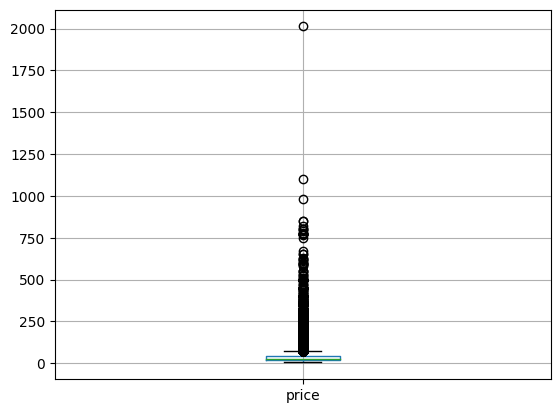

In [398]:
#check if has outliers  
data.boxplot(column=['price'])

<AxesSubplot: >

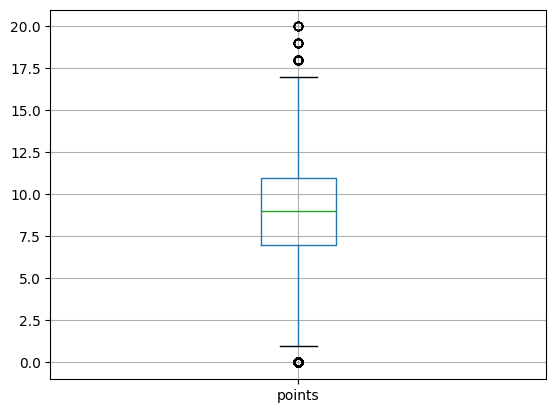

In [399]:
data.boxplot(column=['points'])

In [400]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86158 entries, 1 to 129970
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      86158 non-null  object 
 1   description  86158 non-null  object 
 2   designation  86158 non-null  object 
 3   points       86158 non-null  int64  
 4   price        86158 non-null  float64
 5   province     86158 non-null  object 
 6   region_1     86158 non-null  object 
 7   taster_name  86158 non-null  object 
 8   variety      86158 non-null  object 
 9   winery       86158 non-null  object 
 10  year         86158 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 7.9+ MB


In [401]:
#count outliers
def count_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0]

print(count_outliers(data, 'price'))

6064


In [402]:
def check_outliers(df, column):
    q1 = df[column].quantile(0.01)
    q3 = df[column].quantile(0.99)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

outliers = check_outliers(data, 'price')
outliers


,country,description,designation,points,price,province,region_1,taster_name,variety,winery,year
347,Germany,"Dusty, saffron-spiced earthiness is juxtaposed...",Kiedrich Gräfenberg Trockenbeerenauslese,17,775.0,Rheingau,Rheingau,Anna Lee C. Iijima,Riesling,Robert Weil,2014
353,France,"This beautiful, rich wine has yellow fruits an...",Le Montrachet,16,630.0,Burgundy,Montrachet,Roger Voss,Chardonnay,Louis Latour,2014
354,Germany,"Whiffs of white mushroom, saffron and caramel ...",Kiedrich Gräfenberg Beerenauslese,16,365.0,Rheingau,Rheingau,Anna Lee C. Iijima,Riesling,Robert Weil,2014
3201,Italy,"Cassis, bell pepper, toast, French oak and coc...",Redigaffi,10,400.0,Tuscany,Toscana,Kerin O’Keefe,Merlot,Tua Rita,2013
6679,Italy,Surprisingly bright for the vintage and displa...,Costa Russi,13,500.0,Piedmont,Langhe,Kerin O’Keefe,Red Blend,Gaja,2011
...,...,...,...,...,...,...,...,...,...,...,...
119646,Italy,"Delicately fragrant and incredibly refined, th...",Tre Tine,17,375.0,Piedmont,Barolo,Kerin O’Keefe,Nebbiolo,Giuseppe Rinaldi,2013
120391,US,The nose on this single-vineyard wine from a s...,Roger Rose Vineyard,11,2013.0,California,Arroyo Seco,Matt Kettmann,Chardonnay,Blair,2013
121941,France,"A ripe, dense wine, this has powerful fruit an...",Les Demoiselles,16,450.0,Burgundy,Chevalier-Montrachet,Roger Voss,Chardonnay,Louis Latour,2015
122422,Germany,This stunning TBA is a powerhouse of superripe...,Wehlener Sonnenuhr Trockenbeerenauslese,16,440.0,Mosel,Mosel,Anna Lee C. Iijima,Riesling,S.A. Prüm,2010


In [403]:
print(count_outliers(data, 'points'))

306


In [404]:
#count diferent values in the columns
data['country'].value_counts()

US                        36722
France                    11824
Italy                      7613
Spain                      5803
Portugal                   4635
Chile                      4280
Argentina                  3661
Austria                    2758
Germany                    2078
Australia                  1943
New Zealand                1264
South Africa               1204
Israel                      483
Greece                      440
Canada                      252
Bulgaria                    141
Hungary                     140
Romania                     120
Uruguay                     108
Turkey                       90
Georgia                      82
Slovenia                     78
Croatia                      70
Mexico                       65
Moldova                      57
England                      55
Brazil                       38
Lebanon                      35
Morocco                      28
Peru                         16
Serbia                       12
Macedoni

In [405]:
data['designation'].value_counts()

Cabernet Sauvignon                     2210
Chardonnay                             2021
Pinot Noir                             1979
Reserve                                1399
Sauvignon Blanc                        1370
                                       ... 
Château de Montguéret                     1
Ana Owner's Choice                        1
Graacher Himmelreich Vat 69 Eiswein       1
Selección de Barricas Reserva             1
Lieu-dit Harth Cuvée Caroline             1
Name: designation, Length: 29144, dtype: int64

In [406]:
data['province'].value_counts()

California          19713
Washington           8503
Oregon               5244
Northern Spain       3547
Mendoza Province     3137
                    ...  
Santa Catarina          1
Dingač                  1
Ticino                  1
Lemesos                 1
Neuchâtel               1
Name: province, Length: 410, dtype: int64

In [407]:
data['region_1'].value_counts()

Columbia Valley (WA)       4062
Mendoza                    2247
Willamette Valley          2223
Napa Valley                1841
Alsace                     1781
                           ... 
Hrvatsko Primorje             1
Vin Santo di Carmignano       1
Mâcon-Fuissé                  1
Central Greece                1
Paestum                       1
Name: region_1, Length: 1389, dtype: int64

In [408]:
data['taster_name'].value_counts()

Roger Voss            14565
Michael Schachner     14089
Virginie Boone         9398
Paul Gregutt           9325
Kerin O’Keefe          7406
Matt Kettmann          6188
Joe Czerwinski         4791
Sean P. Sullivan       4734
Anna Lee C. Iijima     4291
Jim Gordon             4002
Anne Krebiehl MW       3187
Lauren Buzzeo          1668
Susan Kostrzewa        1028
Mike DeSimone           490
Jeff Jenssen            452
Alexander Peartree      385
Carrie Dykes            133
Fiona Adams              21
Christina Pickard         5
Name: taster_name, dtype: int64

In [409]:
data['variety'].value_counts()

Pinot Noir                  9274
Chardonnay                  7473
Cabernet Sauvignon          6158
Red Blend                   5952
Riesling                    4675
                            ... 
Pinotage-Merlot                1
Maria Gomes-Bical              1
Manzoni                        1
Syrah-Grenache-Viognier        1
Bobal-Cabernet Sauvignon       1
Name: variety, Length: 637, dtype: int64

In [410]:
data['winery'].value_counts()

DFJ Vinhos               209
Wines & Winemakers       208
Chateau Ste. Michelle    193
Concha y Toro            162
Columbia Crest           158
                        ... 
Pesquera                   1
Lisini                     1
Brick Road                 1
Quinta do Grifo            1
Penedo Borges              1
Name: winery, Length: 12106, dtype: int64

In [411]:
#fatorize the columns
data['country'] = pd.factorize(data['country'])[0]
data['province'] = pd.factorize(data['province'])[0]
data['region_1'] = pd.factorize(data['region_1'])[0]
data['taster_name'] = pd.factorize(data['taster_name'])[0]
data['variety'] = pd.factorize(data['variety'])[0]
data['winery'] = pd.factorize(data['winery'])[0]
data['designation'] = pd.factorize(data['designation'])[0]

In [412]:
data.head()

,country,description,designation,points,price,province,region_1,taster_name,variety,winery,year
1,0,"This is ripe and fruity, a wine that is smooth...",0,7,15.0,0,0,0,0,0,2011
2,1,"Tart and snappy, the flavors of lime flesh and...",1,7,14.0,1,1,1,1,1,2013
3,1,"Pineapple rind, lemon pith and orange blossom ...",2,7,13.0,2,2,2,2,2,2013
4,1,"Much like the regular bottling from 2012, this...",3,7,65.0,1,1,1,3,3,2012
5,2,Blackberry and raspberry aromas show a typical...,4,7,15.0,3,3,3,4,4,2011


In [413]:
#count missing values
data.isna().sum()

country        0
description    0
designation    0
points         0
price          0
province       0
region_1       0
taster_name    0
variety        0
winery         0
year           0
dtype: int64

## Testing the model

### Linear Regression

In [414]:
X = data[['country', 'designation', 'price', 'province', 'region_1', 'taster_name', 'variety', 'winery', 'year']]
y = data['points']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=53)

In [415]:
linear_regressor = LinearRegression()  
linear_regressor.fit(X_train, y_train) #training the algorithm

LinearRegression()

In [416]:
print(linear_regressor.intercept_)

6.274125041729692


In [417]:
coeff_df = pd.DataFrame(linear_regressor.coef_, X.columns, columns=['Coefficient'])
coeff_df

,Coefficient
country,-0.054519
designation,0.000024
price,0.037877
province,0.000938
region_1,-0.000254
taster_name,0.067124
variety,-0.001051
winery,-0.000092
year,0.000552


In [418]:
linear_pred = linear_regressor.predict(X_test)

In [419]:
X_train.size

620334

In [420]:
y_train.size

68926

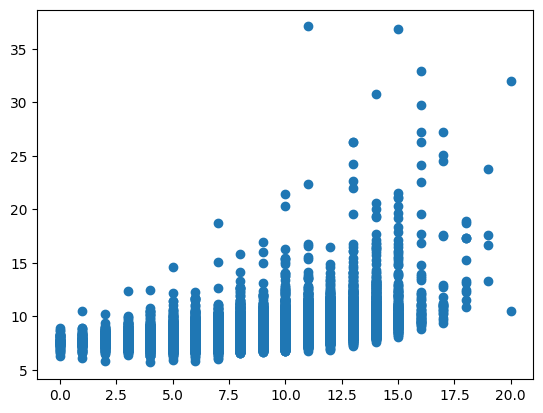

In [421]:
plt.scatter(y_test, linear_pred)

/tmp/ipykernel_17105/3722717442.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_test-linear_pred), bins=50);


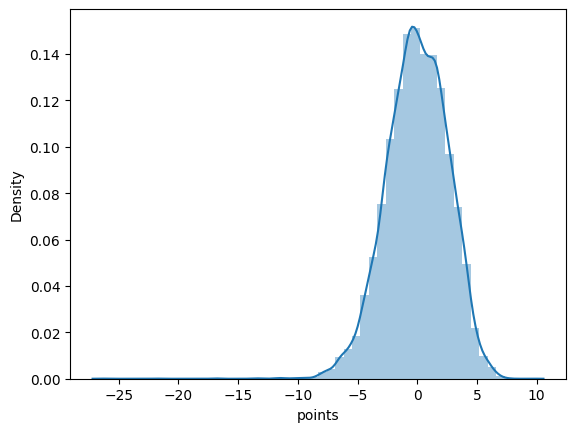

In [422]:
sns.distplot((y_test-linear_pred), bins=50);

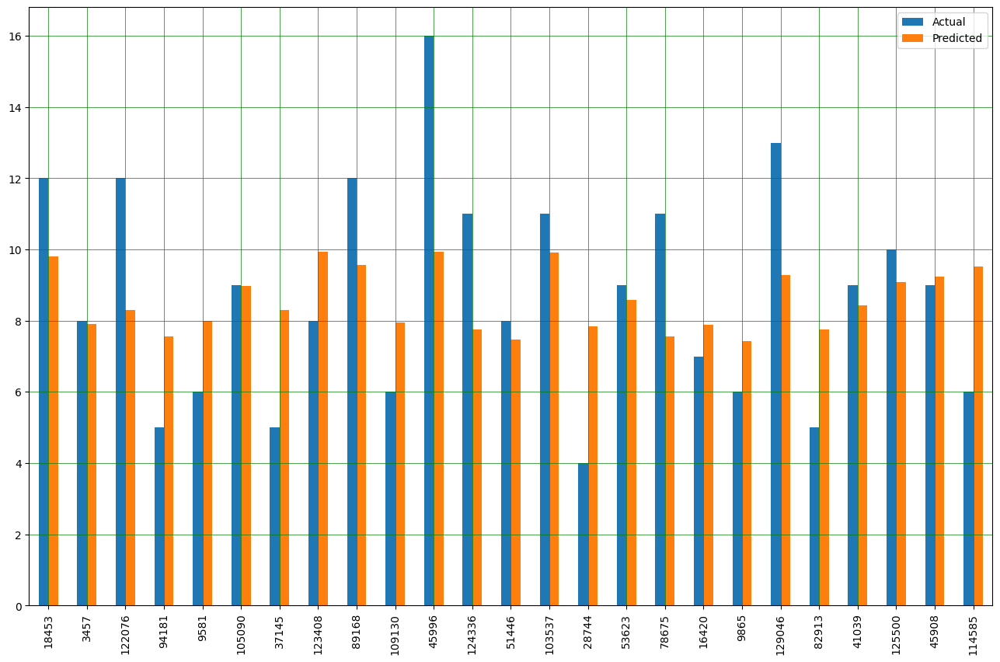

In [423]:
#compare the predicted values with the actual values
df = pd.DataFrame({'Actual': y_test, 'Predicted': linear_pred})
df

#plot the predicted values with the actual values
df1 = df.head(25)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()



In [424]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, linear_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, linear_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, linear_pred)))

Mean Absolute Error: 2.052997443639431
Mean Squared Error: 6.619979139495845
Root Mean Squared Error: 2.5729320122179375


### Kernel Density Estimation Plot

CPU times: user 870 ms, sys: 195 ms, total: 1.07 s
Wall time: 798 ms


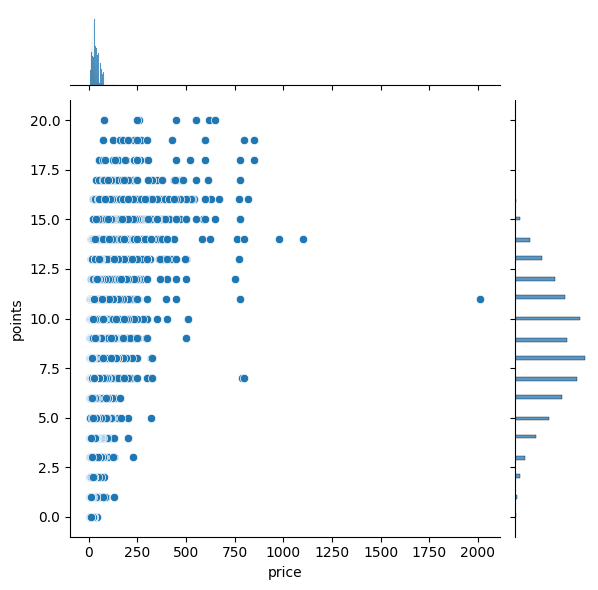

In [425]:
%%time
# Jointplot
sns.jointplot(x=data['price'], y=data['points'])

CPU times: user 20.1 s, sys: 1.32 s, total: 21.4 s
Wall time: 19.7 s


<AxesSubplot: xlabel='price', ylabel='points'>

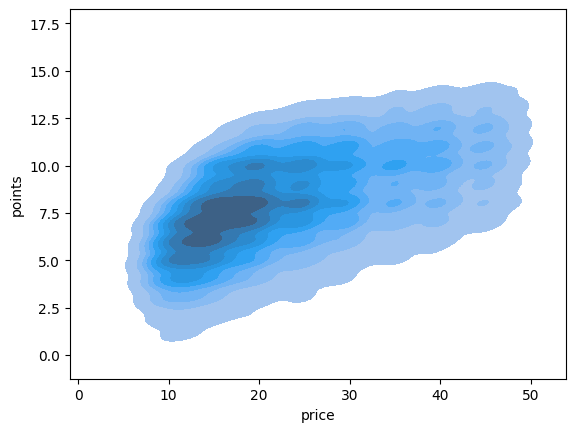

In [426]:
%%time
# Plotted price and point value KDE Chart
sns.kdeplot(data = data[data['price'] < 50], x='price', y='points', fill=True)

As we can see, there is a big concentration of wines between the prices of 10 and 20 dollars and around the 90 points, so this can mean that people prefer to buy average priced wines. Regarding that, wine producers should focus their production in this range in order to have more purchases from the public.

### Random tree regressor

In [427]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
 
 # create regressor object
random_regressor = RandomForestRegressor(random_state = 53)
 
# fit the regressor with x and y data
random_regressor.fit(X_train, y_train) 

RandomForestRegressor(random_state=53)

In [428]:
#predict
random_pred = random_regressor.predict(X_test)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, random_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, random_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, random_pred)))

Mean Absolute Error: 1.476311557677853
Mean Squared Error: 3.806191575247536
Root Mean Squared Error: 1.9509463281309243


In [512]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

### Decision tree regressor

In [429]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor 
  
# create a regressor object
decision_regressor = DecisionTreeRegressor(random_state = 53) 
  
# fit the regressor with X and Y data
decision_regressor.fit(X_train, y_train)

DecisionTreeRegressor(random_state=53)

In [430]:
# predict
decision_pred = decision_regressor.predict(X_test)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, decision_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, decision_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, decision_pred)))

Mean Absolute Error: 1.8767022593624265
Mean Squared Error: 7.007421592902094
Root Mean Squared Error: 2.6471534887312624


### rede neuronal

In [431]:
import tensorflow as tf

from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

from sklearn.model_selection import GridSearchCV, KFold, train_test_split
from sklearn.preprocessing import MinMaxScaler

RANDOM_SEED = 2021

print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.10.0


In [432]:
y_neural = data[['points']]

In [433]:
# Let's scale the features between [0-1]
scaler_X = MinMaxScaler(feature_range=(0, 1)).fit(X)
scaler_y = MinMaxScaler(feature_range=(0, 1)).fit(y_neural)
X_scaled = pd.DataFrame(scaler_X.transform(X[X.columns]), columns=X.columns)
y_scaled = pd.DataFrame(scaler_y.transform(y_neural[y_neural.columns]), columns=y_neural.columns)

In [434]:
X.head()

,country,designation,price,province,region_1,taster_name,variety,winery,year
1,0,0,15.0,0,0,0,0,0,2011
2,1,1,14.0,1,1,1,1,1,2013
3,1,2,13.0,2,2,2,2,2,2013
4,1,3,65.0,1,1,1,3,3,2012
5,2,4,15.0,3,3,3,4,4,2011


In [435]:
X_scaled.head()

,country,designation,price,province,region_1,taster_name,variety,winery,year
0,0.00000,0.000000,0.005475,0.000000,0.000000,0.000000,0.000000,0.000000,0.163065
1,0.02439,0.000034,0.004978,0.002445,0.000720,0.055556,0.001572,0.000083,0.163387
2,0.02439,0.000069,0.004480,0.004890,0.001441,0.111111,0.003145,0.000165,0.163387
3,0.02439,0.000103,0.030363,0.002445,0.000720,0.055556,0.004717,0.000248,0.163226
4,0.04878,0.000137,0.005475,0.007335,0.002161,0.166667,0.006289,0.000330,0.163065


In [436]:
X_train_neural, X_test_neural, y_train_neural, y_test_neural = train_test_split(X_scaled, y_scaled,
test_size=0.2,
random_state=RANDOM_SEED)

In [499]:
def build_model(activation='relu', learning_rate=0.01):
    #Create a sequential model (with three Layers - Last one is the output)
    model = Sequential()
    model.add(Dense(9, input_dim=9, activation=activation))
    model.add(Dense(11, activation=activation))
    model.add(Dense(1, activation='relu'))

    #Compile the model
    #Define the Loss function, the otimizer and metrics to be used
    model.compile(
        loss = 'mae',
        optimizer = tf.optimizers.Adam(learning_rate),
        metrics = ['mae', 'mse' ])

    return model

In [500]:
model = build_model()
model.summary()


Model: "sequential_276"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1125 (Dense)          (None, 9)                 90        
                                                                 
 dense_1126 (Dense)          (None, 11)                110       
                                                                 
 dense_1127 (Dense)          (None, 1)                 12        
                                                                 
Total params: 212
Trainable params: 212
Non-trainable params: 0
_________________________________________________________________


In [501]:
TUNING_DICT = {
    'activation' : ['relu', 'sigmoid'],
    'learning_rate' : [0.01, 0.001]
}

In [502]:
kf = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)

model = KerasRegressor(build_fn=build_model, epochs=10, batch_size=32)
grid_search = GridSearchCV(estimator = model,
            param_grid = TUNING_DICT,
            cv = kf,
            scoring = 'neg_mean_absolute_error',
            refit = 'True',
            verbose = 1)

grid_search.fit(X_train_neural, y_train_neural, validation_split=0.2)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Epoch 1/10


/tmp/ipykernel_17105/2347243593.py:3: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasRegressor(build_fn=build_model, epochs=10, batch_size=32)


1379/1379 [==============================] - 2s 1ms/step - loss: 0.1037 - mae: 0.1037 - mse: 0.0172 - val_loss: 0.0922 - val_mae: 0.0922 - val_mse: 0.0137
Epoch 2/10
1379/1379 [==============================] - 1s 978us/step - loss: 0.0943 - mae: 0.0943 - mse: 0.0142 - val_loss: 0.0919 - val_mae: 0.0919 - val_mse: 0.0134
Epoch 3/10
1379/1379 [==============================] - 2s 1ms/step - loss: 0.0936 - mae: 0.0936 - mse: 0.0140 - val_loss: 0.0971 - val_mae: 0.0971 - val_mse: 0.0156
Epoch 4/10
1379/1379 [==============================] - 1s 999us/step - loss: 0.0929 - mae: 0.0929 - mse: 0.0138 - val_loss: 0.0909 - val_mae: 0.0909 - val_mse: 0.0136
Epoch 5/10
1379/1379 [==============================] - 1s 976us/step - loss: 0.0926 - mae: 0.0926 - mse: 0.0137 - val_loss: 0.0973 - val_mae: 0.0973 - val_mse: 0.0158
Epoch 6/10
1379/1379 [==============================] - 1s 1ms/step - loss: 0.0923 - mae: 0.0923 - mse: 0.0136 - val_loss: 0.0904 - val_mae: 0.0904 - val_mse: 0.0132
Epoch 7/1

GridSearchCV(cv=KFold(n_splits=5, random_state=2021, shuffle=True),
             estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x7fb68df33400>,
             param_grid={'activation': ['relu', 'sigmoid'],
                         'learning_rate': [0.01, 0.001]},
             refit='True', scoring='neg_mean_absolute_error', verbose=1)

In [503]:
#summarize results
print("Best: %f using %s" % (grid_search.best_score_, grid_search.best_params_))
means=grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip (means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: -0.091198 using {'activation': 'relu', 'learning_rate': 0.001}
-0.160448 (0.134984) with: {'activation': 'relu', 'learning_rate': 0.01}
-0.091198 (0.001398) with: {'activation': 'relu', 'learning_rate': 0.001}
-0.363181 (0.135584) with: {'activation': 'sigmoid', 'learning_rate': 0.01}
-0.165564 (0.132389) with: {'activation': 'sigmoid', 'learning_rate': 0.001}


In [504]:
best_mlp_model = grid_search.best_estimator_

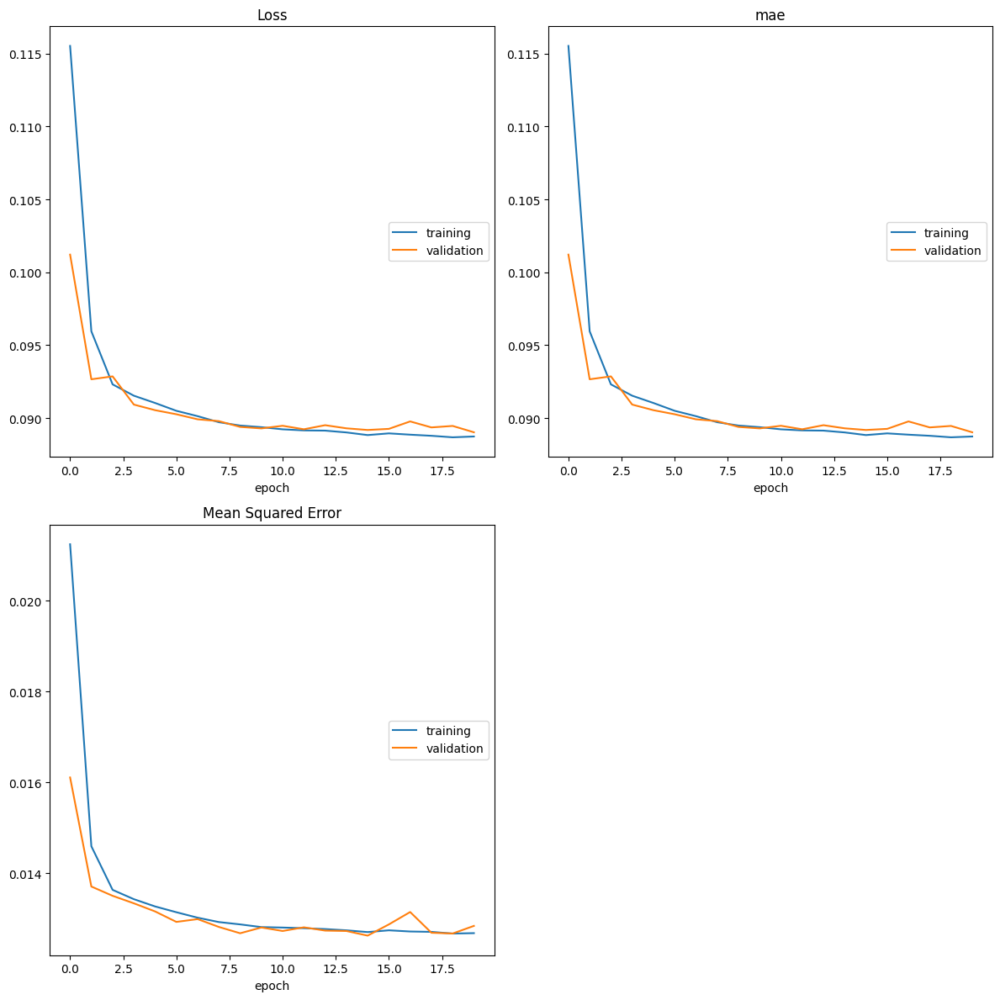

Loss
	training         	 (min:    0.089, max:    0.116, cur:    0.089)
	validation       	 (min:    0.089, max:    0.101, cur:    0.089)
mae
	training         	 (min:    0.089, max:    0.116, cur:    0.089)
	validation       	 (min:    0.089, max:    0.101, cur:    0.089)
Mean Squared Error
	training         	 (min:    0.013, max:    0.021, cur:    0.013)
	validation       	 (min:    0.013, max:    0.016, cur:    0.013)
2154/2154 [==============================] - 2s 1ms/step - loss: 0.0887 - mae: 0.0887 - mse: 0.0127 - val_loss: 0.0890 - val_mae: 0.0890 - val_mse: 0.0128


In [505]:
from livelossplot import PlotLossesKerasTF

best_mlp_model.fit(X_train_neural, y_train_neural, epochs=20, validation_data=(X_test_neural, y_test_neural), callbacks=[PlotLossesKerasTF()], verbose=1)

In [506]:
neural_pred = best_mlp_model.predict(X_test_neural)
neural_pred = neural_pred.reshape(neural_pred.shape[0], 1)
neural_pred[:9]

539/539 [==============================] - 0s 611us/step


array([[0.3750937 ],
       [0.5080505 ],
       [0.4544676 ],
       [0.3920275 ],
       [0.4186374 ],
       [0.39697117],
       [0.5346498 ],
       [0.5589626 ],
       [0.5954379 ]], dtype=float32)

In [507]:
neural_pred_unscaled = scaler_y.inverse_transform(neural_pred)
neural_pred_unscaled[:9]

array([[ 7.501874 ],
       [10.16101  ],
       [ 9.089352 ],
       [ 7.84055  ],
       [ 8.372747 ],
       [ 7.9394236],
       [10.692996 ],
       [11.179252 ],
       [11.908758 ]], dtype=float32)

In [508]:
y_test_unscaled = scaler_y.inverse_transform(y_test_neural)
y_test_unscaled[:9]

array([[ 6.],
       [10.],
       [ 7.],
       [ 7.],
       [11.],
       [ 7.],
       [ 7.],
       [11.],
       [13.]])

In [509]:
print('MAE:', metrics.mean_absolute_error(y_test, neural_pred))
print('MSE:', metrics.mean_squared_error(y_test, neural_pred))
print('RMSE:', np. sqrt (metrics.mean_squared_error(y_test, neural_pred)))

MAE: 8.161306042130777
MSE: 75.35773824899682
RMSE: 8.680883494725455
